In [3]:
import torch

In [ ]:
a = torch.tensor([1, 2, 3], dtype=torch.float32)
print(a)

In [ ]:
b = torch.rand([3, 3, 3], dtype=torch.float32)
print(b)

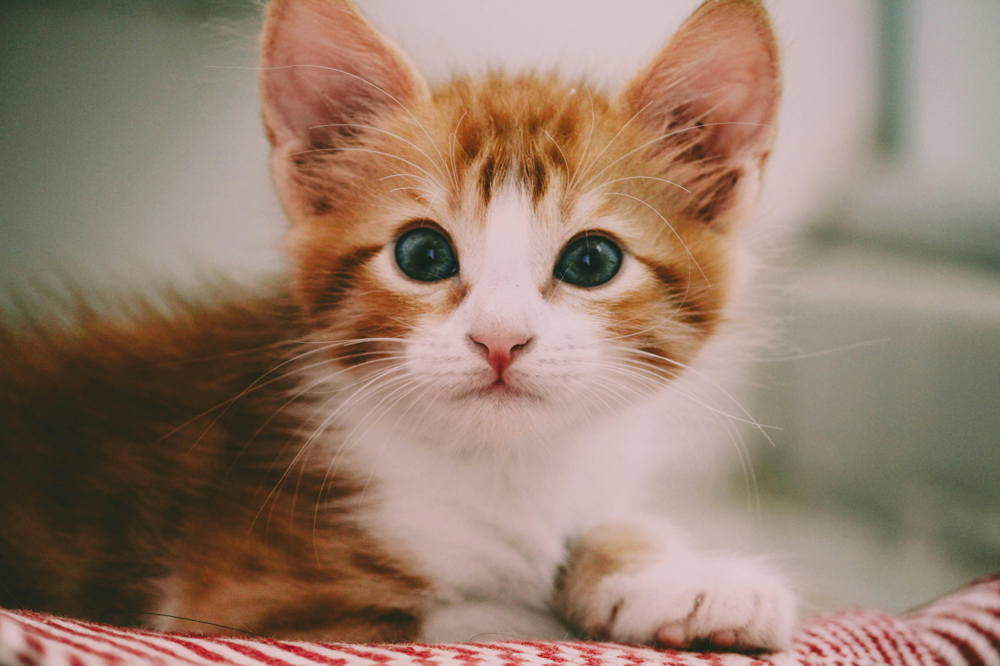

torch.Size([3456, 5184, 3])


In [9]:
import numpy as np
from PIL import Image

img = Image.open("cat.jpg")
display(img)
c = torch.as_tensor(np.array(img)).float()
print(c.shape)

In [ ]:
a = torch.arange(10)
b = torch.ones(10)
print(f"{a = }")
print(f"{b = }")
print(f"{a ** (2 * b) = }")

In [ ]:
a = torch.rand(4)
b = torch.rand(5)
# print(a + b)

In [ ]:
a = torch.rand(500_000_000)
b = torch.rand(500_000_000)
c = a + b

In [ ]:
%timeit c = a + b

In [ ]:
a_gpu = a.to("cuda")
b_gpu = b.to("cuda")
%timeit c_gpu = a_gpu + b_gpu

In [ ]:
a = torch.arange(6)
print(a.reshape(2, 3))

In [ ]:
a = torch.rand(2, 3, 4)
print(a.permute(1, 2, 0).shape)

In [ ]:
a = torch.arange(6).view(3, 2, 1, 1)
print(a.squeeze().shape)

In [ ]:
a = torch.arange(4).view(4, 1)
b = torch.arange(5).view(1, 5) * 10
print(f"{a = }")
print(f"{b = }")
print(a - b)

In [19]:
x = torch.randn(10, 2)
#print(x)
d = torch.zeros(10, 10)
for i in range(10):
    for j in range(10):
        print(f"{i = }, {j = }, {x[i] = }, {x[j] = }")
        d[i, j] = (x[i] - x[j]).pow(2).sum()

d = (x[:, None, :] - x[None, :, :]).pow(2).sum(-1)

i = 0, j = 0, x[i] = tensor([ 0.6606, -0.3120]), x[j] = tensor([ 0.6606, -0.3120])
i = 0, j = 1, x[i] = tensor([ 0.6606, -0.3120]), x[j] = tensor([0.2702, 0.6218])
i = 0, j = 2, x[i] = tensor([ 0.6606, -0.3120]), x[j] = tensor([1.9665, 0.3527])
i = 0, j = 3, x[i] = tensor([ 0.6606, -0.3120]), x[j] = tensor([-1.1193, -0.4449])
i = 0, j = 4, x[i] = tensor([ 0.6606, -0.3120]), x[j] = tensor([ 0.3813, -0.4229])
i = 0, j = 5, x[i] = tensor([ 0.6606, -0.3120]), x[j] = tensor([-0.8835,  0.3952])
i = 0, j = 6, x[i] = tensor([ 0.6606, -0.3120]), x[j] = tensor([-0.7946, -1.0313])
i = 0, j = 7, x[i] = tensor([ 0.6606, -0.3120]), x[j] = tensor([-0.6625,  0.7360])
i = 0, j = 8, x[i] = tensor([ 0.6606, -0.3120]), x[j] = tensor([1.5648, 0.3269])
i = 0, j = 9, x[i] = tensor([ 0.6606, -0.3120]), x[j] = tensor([0.3287, 1.4645])
i = 1, j = 0, x[i] = tensor([0.2702, 0.6218]), x[j] = tensor([ 0.6606, -0.3120])
i = 1, j = 1, x[i] = tensor([0.2702, 0.6218]), x[j] = tensor([0.2702, 0.6218])
i = 1, j = 2, x[i]

In [ ]:
x = torch.randn(10, 2)
d = torch.zeros(10, 10)
max_dist, max_idx = 0, (-1, -1)
for i in range(10):
    for j in range(10):
        if (x[i] - x[j]).pow(2).sum() > max_dist:
            max_dist, max_idx = (x[i] - x[j]).pow(2).sum(), (i, j)

print(max_dist, max_idx)

d = (x[:, None, :] - x[None, :, :]).pow(2).sum(-1)
print(d.max(), (d.argmax() // 10, d.argmax() % 10))

In [ ]:
a = torch.rand(2, 4)
b = torch.rand(4)
c = b @ a.mT
print(c.shape)
print(torch.linalg.norm(b))
# print(b.pow(2).sum().sqrt())

Tensor c:
 tensor([[[255.,   0.,   0.],
         [  0., 255.,   0.],
         [ 40., 100.,  80.]],

        [[  0.,   0., 255.],
         [255., 255.,   0.],
         [160., 255., 200.]]])
Shape: torch.Size([2, 3, 3])  — (Height, Width, Channels)
Top-left pixel (as floats): tensor([255.,   0.,   0.])


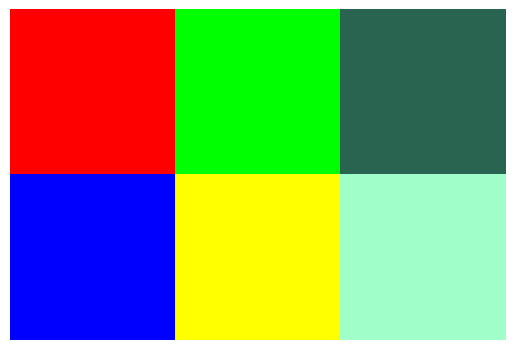

In [13]:
import numpy as np
import torch
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.transforms import ToPILImage

# 1) Create a tiny 2×2 RGB image as a NumPy array (values 0–255, dtype uint8)
arr = np.array([
    [[255,   0,   0],   # pixel (0,0) is Red
     [  0, 255,   0],
     [  40, 100,   80]],  # pixel (0,1) is Green
    [[  0,   0, 255],   # pixel (1,0) is Blue
     [255, 255,   0],
     [  160, 255,   200]]   # pixel (1,1) is Yellow
], dtype=np.uint8)
# arr.shape == (2, 2, 3)

# 2) Convert that NumPy array into a PyTorch tensor
c = torch.as_tensor(arr).float()
# Now:
#   c.shape == torch.Size([2, 2, 3])   # [H, W, C]
#   c.dtype == torch.float32
#   c[0,0] == tensor([255.,   0.,   0.])  # the RGB float values of top-left

print("Tensor c:\n", c)
print("Shape:", c.shape, " — (Height, Width, Channels)")
print("Top-left pixel (as floats):", c[0, 0])

# 3) Convert the tensor back to a PIL image for display
#    (Note: ToPILImage expects a channels-first tensor [C, H, W], so we permute)
to_pil = ToPILImage()
pil_img = to_pil(c.permute(2, 0, 1) / 255.0)  
# dividing by 255.0 scales us into [0,1] which ToPILImage expects for float tensors

# 4) Show it
plt.imshow(pil_img)
plt.axis('off')
plt.show()


In [15]:
a = torch.rand(1_000_000_000)
b = torch.rand(1_000_000_000)
c = a + b


In [16]:
%timeit c = a + b

3.25 s ± 1.28 s per loop (mean ± std. dev. of 7 runs, 1 loop each)
